[private 3rd] slowfast with class balanced loss : https://dacon.io/competitions/official/236064/codeshare/7770?page=1&dtype=recent

In [18]:
from google.colab import drive
drive.mount('/content/drive')



Mounted at /content/drive


In [25]:
drive_path = '/content/drive/MyDrive/Colab Notebooks/Data Project/Final/SlowFast'

In [26]:
!pip install pytorchvideo

In [2]:
import random
import pandas as pd
import numpy as np
import os
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

import torchvision.models as models
import torchvision.transforms as transforms

from tqdm.auto import tqdm
from sklearn.metrics import f1_score,accuracy_score
from sklearn.preprocessing import LabelEncoder

from pytorchvideo.transforms import Normalize

import warnings
warnings.filterwarnings(action='ignore')

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional_tensor.py:5: UserWarning: The torchvision.transforms.functional_tensor module is deprecated in 0.15 and will be **removed in 0.17**. Please don't rely on it. You probably just need to use APIs in torchvision.transforms.functional or in torchvision.transforms.v2.functional.
  warnings.warn(


In [3]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
device

device(type='cuda')

### Hyperparameter Setting

In [4]:
CFG = {
    'VIDEO_LENGTH': 50,
    'IMG_SIZE':128,
    'EPOCHS': 10,
    'LEARNING_RATE':5e-5,
    'BATCH_SIZE':8,
    'SEED':42,
    'SAVE_EVERY' : 5
}

### RandomSeed



In [5]:
def seed_everything(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

seed_everything(CFG['SEED'])

### Data Download

In [ ]:
!pip install kaggle --upgrade

In [ ]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"devyun","key":"5e2095c648de7d03b7f05a53f92efbfa"}'}

In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle datasets download -d tesisjulinwilson/ucf-crimes-dataset

100% 4.20G/4.21G [01:02<00:00, 163MB/s]
100% 4.21G/4.21G [01:02<00:00, 71.9MB/s]


In [ ]:
import zipfile
import os

def zip_extract(file_path, extracted_path):
  with zipfile.ZipFile(file_path, 'r') as zip_ref:
      zip_ref.extractall(extracted_path)

  extracted_folders = os.listdir(extracted_path)
  print("압축 해제된 폴더 목록:")
  for idx, folder in enumerate(extracted_folders):
      print(f"{idx + 1}: {folder}")



In [ ]:
file_path = "./ucf-crimes-dataset.zip"
extracted_path = "./ucf_crime_dataset"

zip_extract(file_path, extracted_path)

압축 해제된 폴더 목록:
1: UCFcrimes


#### 데이터 정보가 담긴 csv 파일 생성

In [ ]:
from tqdm.notebook import tqdm
import pandas as pd
import re
import os
import cv2

def get_frame_count(video_path):
    cap = cv2.VideoCapture(video_path)
    frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    cap.release()
    return frame_count

def create_data_info(path):
    video_id_list = []
    video_path_list = []
    label_list = []

    list_dir = os.listdir(path)

    for dir in tqdm(list_dir):
        class_path = os.path.join(path, dir)
        print(f'dir : {dir}')
        if dir =='Fight':
          label = 'Anormaly'
        else:
          label = 'Normal'

        video_list = os.listdir(class_path)
        for video in video_list:
              video_path = os.path.join(class_path, video)
              video_id = re.sub(r'\.mp4$', '', video)
              frame_count = get_frame_count(video_path)
              video_id_list.append(video_id)
              video_path_list.append(video_path)
              label_list.append(label)

    print('---create train dataframe---')

    train_df = pd.DataFrame({
        'video_id': video_id_list,
        'video_path': video_path_list,
        'label': label_list
    })

    return train_df



In [ ]:
path = '/content/ucf_crime_dataset/UCFcrimes'
train_df = create_data_info(path)

  0%|          | 0/2 [00:00<?, ?it/s]

dir : NonFight
dir : Fight
---create train dataframe---


In [6]:
train_df = pd.read_csv('/content/train_df.csv')
train_df

,Unnamed: 0,video_id,video_path,label,label_encoded
0,0,Normal_Videos296_x264,/content/ucf_crime_dataset/UCFcrimes/NonFight/...,Normal,1
1,1,Normal_Videos281_x264,/content/ucf_crime_dataset/UCFcrimes/NonFight/...,Normal,1
2,2,Normal_Videos278_x264,/content/ucf_crime_dataset/UCFcrimes/NonFight/...,Normal,1
3,3,Normal_Videos101_x264,/content/ucf_crime_dataset/UCFcrimes/NonFight/...,Normal,1
4,4,Normal_Videos158_x264,/content/ucf_crime_dataset/UCFcrimes/NonFight/...,Normal,1
...,...,...,...,...,...
395,395,Fighting028_x264,/content/ucf_crime_dataset/UCFcrimes/Fight/Fig...,Anormaly,0
396,396,Robbery115_x264,/content/ucf_crime_dataset/UCFcrimes/Fight/Rob...,Anormaly,0
397,397,Abuse036_x264,/content/ucf_crime_dataset/UCFcrimes/Fight/Abu...,Anormaly,0
398,398,Robbery023_x264,/content/ucf_crime_dataset/UCFcrimes/Fight/Rob...,Anormaly,0


#### Label Encoder

In [13]:
label_encoder = LabelEncoder()
encoded_labels = label_encoder.fit_transform(train_df['label'])
decoded_labels = label_encoder.inverse_transform(encoded_labels)
train_df['label_encoded'] = encoded_labels

label_mapping = {label: encoded for label, encoded in zip(train_df['label'], encoded_labels)}
unique_label_mapping = {value: key for key, value in label_mapping.items()}

print(unique_label_mapping)
print(len(unique_label_mapping))

{1: 'Normal', 0: 'Anormaly'}
2


In [14]:
train_df

,Unnamed: 0,video_id,video_path,label,label_encoded
0,0,Normal_Videos296_x264,/content/ucf_crime_dataset/UCFcrimes/NonFight/...,Normal,1
1,1,Normal_Videos281_x264,/content/ucf_crime_dataset/UCFcrimes/NonFight/...,Normal,1
2,2,Normal_Videos278_x264,/content/ucf_crime_dataset/UCFcrimes/NonFight/...,Normal,1
3,3,Normal_Videos101_x264,/content/ucf_crime_dataset/UCFcrimes/NonFight/...,Normal,1
4,4,Normal_Videos158_x264,/content/ucf_crime_dataset/UCFcrimes/NonFight/...,Normal,1
...,...,...,...,...,...
395,395,Fighting028_x264,/content/ucf_crime_dataset/UCFcrimes/Fight/Fig...,Anormaly,0
396,396,Robbery115_x264,/content/ucf_crime_dataset/UCFcrimes/Fight/Rob...,Anormaly,0
397,397,Abuse036_x264,/content/ucf_crime_dataset/UCFcrimes/Fight/Abu...,Anormaly,0
398,398,Robbery023_x264,/content/ucf_crime_dataset/UCFcrimes/Fight/Rob...,Anormaly,0


In [ ]:
train_df.to_csv(f'{drive_path}/train_df.csv')

### CustomDataset

#### Train Dataset

**pad_frames**

제로 패딩 추가하여 VIDEO_LENGTH와 동일한 길이로 맞춘다

**데이터 증강**

- ColorJitter:

  색상 조절을 통해 이미지의 색감을 다양하게 바꿀 수 있는 기술입니다.
  주로 밝기, 대비, 채도, 색상(hue)을 무작위로 조절합니다.
  예를 들어, 이미지에 약간의 밝기와 대비를 더하거나, 이미지 색상을 무작위로 변형하여 데이터 다양성을 증가시킵니다.

- RandomHorizontalFlip:

  이미지를 무작위로 좌우로 뒤집는 데이터 증강입니다.
  이를 통해 객체의 좌우 대칭성을 고려할 수 있으며, 모델이 좌우 반전된 이미지를 인식할 수 있도록 학습합니다.

- RandomRotation:

  이미지를 무작위로 회전시키는 데이터 증강입니다.
  회전 각도는 무작위로 선택되며, 이를 통해 모델이 이미지의 다양한 각도에서도 패턴을 인식할 수 있도록 돕습니다.

- RandomResizedCrop:

  이미지를 임의로 크롭하고 크기를 조절하는 데이터 증강입니다.
  먼저 이미지를 임의의 위치에서 크롭하고, 그 다음 임의의 크기로 조절합니다.
  이를 통해 이미지의 일부를 잘라내고 크기를 변경함으로써 모델이 다양한 객체 크기 및 위치에 대해 학습할 수 있게 됩니다.

#### Test Dataset

테스트 데이터셋은 모든 프레임 별 이상행동 예측을 하기위해 비디오를 배치 사이즈를 50 length 나눠 전체 프레임에 대한 리스트를 만든다 .

Resnet 50 백본으로 이용하는 pretrained SlowFast 모델은 low frame 을 12 프레임으로만 설정해야 하기때문에 전체 리스트를 한번에 테스트 할 수 가 없음

In [7]:
from PIL import Image

mean = (0.45, 0.45, 0.45)
std = (0.225, 0.225, 0.225)

class CustomDataset(Dataset):
    def __init__(self, video_path_list, label_list, trans, is_train=True):
        self.video_path_list = video_path_list
        self.label_list = label_list
        self.is_train = is_train
        # 정규화
        self.norm = Normalize(mean, std)

        # 데이터 증강
        self.trans  = trans

    def pad_frames(self, frames, target_length=CFG['VIDEO_LENGTH']-2):
    # frames 형태: torch.FloatTensor(np.array(frames)).permute(3, 0, 1, 2)
      num_frames = frames.size(1)  # 프레임 수는 두 번째 차원에 위치함
      if num_frames < target_length:
          padding = torch.zeros(frames.size(0), target_length - num_frames, frames.size(2), frames.size(3))
          frames = torch.cat((frames, padding), dim=1)

      return frames

    def __getitem__(self, index):
      frames = []

      if self.is_train:
        frames = self.get_video(self.video_path_list[index])[:, 2:, :, :]
        padded_frames = self.pad_frames(frames) # 제로패딩 추가
        low_frames = padded_frames[:,[i*4+3 for i in range(12)],:,:]
        label = self.label_list[index]

        return low_frames, frames, label

      else:
        all_frames = self.get_video(self.video_path_list[index])
        range_size = all_frames.size(1) - (all_frames.size(1) % (CFG['VIDEO_LENGTH']-2))
        batched_frames = [all_frames[:, i: i+CFG['VIDEO_LENGTH']-2, :, :] for i in range(0, range_size, CFG['VIDEO_LENGTH']-2)]
        # low_frames를 조정하여 frames와 크기를 맞춥니다.
        low_frames = []
        for frame in batched_frames:
            # 배치에서 필요한 부분을 가져와 low_frames에 추가합니다.
            low_frame = frame[:, [i*4+3 for i in range(12)], :, :]
            low_frames.append(low_frame)

        return low_frames, batched_frames

    def __len__(self):
        return len(self.video_path_list)

    def get_video(self, path):
        frames = []
        cap = cv2.VideoCapture(path)

        if self.is_train:
            for _ in range(CFG['VIDEO_LENGTH']):
                _, img = cap.read()
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                img = cv2.resize(img, (CFG['IMG_SIZE'], CFG['IMG_SIZE']))
                img = img / 255.


                if self.trans != None:
                  # OpenCV 이미지를 PIL 이미지로 변환
                  img = Image.fromarray(img.astype('uint8'), 'RGB')
                  # 데이터 증강 적용
                  img = self.trans(img)
                  img = np.array(img).astype(np.float32)

                frames.append(img)
        else:
            while True:
                ret, img = cap.read()
                if not ret:
                    break
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                img = cv2.resize(img, (CFG['IMG_SIZE'], CFG['IMG_SIZE']))
                img = img / 255.
                frames.append(img)


        return self.norm(torch.FloatTensor(np.array(frames)).permute(3, 0, 1, 2))


In [9]:
from sklearn.model_selection import train_test_split


X = train_df['video_path'].values
y = train_df['label_encoded'].values

# 학습 및 검증 데이터셋으로 분리
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=CFG['SEED'])

trans = transforms.Compose([
        transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.RandomRotation(degrees=15),
        transforms.RandomResizedCrop(size=(CFG['IMG_SIZE'], CFG['IMG_SIZE']), scale=(0.8, 1.0))

    ])


train_dataset = CustomDataset(video_path_list=X_train, label_list=y_train, trans = trans)
val_dataset = CustomDataset(video_path_list=X_val, label_list=y_val, trans = None )

train_loader = DataLoader(train_dataset, batch_size=CFG['BATCH_SIZE'], shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=CFG['BATCH_SIZE'], shuffle=False, num_workers=2)

### SlowFast Model



In [10]:
model_name = "slowfast_r50"
slowfast_r50 = torch.hub.load("facebookresearch/pytorchvideo", model=model_name,pretrained=True)
slowfast_r50_layers = slowfast_r50.blocks

Downloading: "https://github.com/facebookresearch/pytorchvideo/zipball/main" to /root/.cache/torch/hub/main.zip
Downloading: "https://dl.fbaipublicfiles.com/pytorchvideo/model_zoo/kinetics/SLOWFAST_8x8_R50.pyth" to /root/.cache/torch/hub/checkpoints/SLOWFAST_8x8_R50.pyth
100%|██████████| 264M/264M [00:00<00:00, 316MB/s]


In [11]:
class SlowFast(nn.Module):
    def __init__(self,img_size=CFG['IMG_SIZE']):
        super(SlowFast, self).__init__()
        self.pool_size = img_size//32-1

        self.layer_1 = slowfast_r50_layers[0]
        self.layer_2 = slowfast_r50_layers[1]
        self.layer_3 = slowfast_r50_layers[2]
        self.layer_4 = slowfast_r50_layers[3]
        self.layer_5 = slowfast_r50_layers[4]

        self.fast_pool = nn.AvgPool3d(kernel_size=(12, self.pool_size, self.pool_size), stride=(1, 1, 1), padding=(0, 0, 0))
        self.slow_pool = nn.AvgPool3d(kernel_size=(48, self.pool_size, self.pool_size), stride=(1, 1, 1), padding=(0, 0, 0))

        self.avgpool = nn.AdaptiveAvgPool3d(1)
        self.label = nn.Linear(2304,len(unique_label_mapping))

        for para in self.layer_1.parameters():
           para.requires_grad = False
        for para in self.layer_2.parameters():
           para.requires_grad = False

    def forward(self, x):
        batch_size = x[0].size(0)
        x = self.layer_1(x)
        x = self.layer_2(x)
        x = self.layer_3(x)
        x = self.layer_4(x)
        x = self.layer_5(x)

        x_1 = self.fast_pool(x[0])
        x_2 = self.slow_pool(x[1])
        x = torch.concat([x_1,x_2],axis=1)
        x = self.avgpool(x).view(batch_size,-1)

        label = self.label(x)
        return label

In [15]:
torch.cuda.empty_cache()

model = SlowFast(img_size=CFG['IMG_SIZE'])
model.eval()
best_model = None
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(params = model.parameters(), lr = CFG["LEARNING_RATE"],weight_decay=0.02)
scheduler = optim.lr_scheduler.MultiStepLR(optimizer, milestones=[12], gamma=0.1)
model = model.to(device)

### Train

In [16]:
!pip install tensorboard tensorboardX


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.7/101.7 kB 3.2 MB/s eta 0:00:00


In [ ]:
# 학습 및 검증 손실 및 정확도 시각화
import matplotlib.pyplot as plt

def draw_metrix(train_losses, train_accuracies, val_losses, val_accuracies, file_name):

  plot_dir = f'{drive_path}/PLOT'
  os.makedirs(plot_dir, exist_ok=True)
  save_path = os.path.join(plot_dir,file_name)

  plt.figure(figsize=(12, 6))
  plt.subplot(1, 2, 1)
  plt.plot(train_losses, label='Train Loss', linestyle='-', color='blue')  # 선 스타일 및 색상 변경
  plt.plot(val_losses, label='Validation Loss', linestyle='--', color='red')  # 선 스타일 및 색상 변경

  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.title('Loss Over Epochs')  # 그래프 제목 추가
  plt.grid(True, linestyle='--', alpha=0.6)  # 그리드 라인 추가
  plt.gca().set_facecolor('lightgray')  # 배경색

  plt.subplot(1, 2, 2)
  plt.plot(train_accuracies, label='Train Accuracy', linestyle='-', color='green')  # 선 스타일 및 색상 변경
  plt.plot(val_accuracies, label='Validation Accuracy', linestyle='--', color='orange')  # 선 스타일 및 색상 변경
  plt.xlabel('Epochs')
  plt.ylabel('Accuracy')
  plt.legend()
  plt.title('Accuracy Over Epochs')  # 그래프 제목 추가
  plt.grid(True, linestyle='--', alpha=0.6)  # 그리드 라인 추가
  plt.gca().set_facecolor('lightgray')  # 배경색

  plt.tight_layout()
  plt.savefig(save_path)

  plt.show()


In [ ]:
def Validate(model, val_loader):
    model.eval()  # 모델을 평가 모드로 설정
    running_loss = 0.0
    correct_predictions = 0
    total_samples = 0

    with torch.no_grad():  # 그라디언트 계산 비활성화
        for fast_videos, videos, labels in iter(val_loader):
            fast_videos = fast_videos.to(device)
            videos = videos.to(device)
            labels = labels.to(device)

            outputs = model([fast_videos, videos])
            loss = criterion(outputs, labels)

            running_loss += loss.item()

            _, predicted = torch.max(outputs.data, 1)
            total_samples += labels.size(0)
            correct_predictions += (predicted == labels).sum().item()

    avg_loss = running_loss / len(val_loader)
    accuracy = correct_predictions / total_samples
    print(f'Validation Loss: {avg_loss:.4f}, Accuracy: {accuracy * 100:.2f}%')
    return avg_loss, accuracy


In [23]:
from datetime import datetime
from tensorboardX import SummaryWriter


def Train(model, train_loader, val_loader):
  train_losses = []
  train_accuracies = []
  val_losses = []
  val_accuracies = []

  best_loss = float('inf')  # 초기화
  best_checkpoint = None

  current_datetime = datetime.now()
  checkpoint_dir = f'{drive_path}/checkpoints_{current_datetime}'
  os.makedirs(checkpoint_dir, exist_ok=True)

  train_log_dir = os.path.join(drive_path,f'logs/train/{current_datetime}')
  val_log_dir = os.path.join(drive_path,f'logs/validation/{current_datetime}')

  train_writer = SummaryWriter(log_dir=train_log_dir)  # 학습용 로그 디렉토리
  val_writer = SummaryWriter(log_dir=val_log_dir)  # 검증용 로그 디렉토리


  for epoch in range(CFG['EPOCHS']):
      model.train()
      running_loss = 0.0
      correct_predictions = 0
      total_samples = 0

      for fast_videos, videos, labels in tqdm(iter(train_loader)):
          fast_videos = fast_videos.to(device)  # Fast pathway
          videos = videos.to(device)
          labels = labels.to(device)

          outputs = model([fast_videos, videos])

          # 손실 계산 및 역전파
          loss = criterion(outputs, labels)
          optimizer.zero_grad()
          loss.backward()
          optimizer.step()

          running_loss += loss.item()

          # 예측값과 실제 레이블을 비교하여 정확한 예측 수를 누적
          _, predicted = torch.max(outputs.data, 1)
          total_samples += labels.size(0)
          correct_predictions += (predicted == labels).sum().item()

      # 평균 손실과 정확도 계산 및 기록
      avg_loss = running_loss / len(train_loader)
      accuracy = correct_predictions / total_samples


      # TensorBoard에 학습 손실 및 정확도 기록
      train_writer.add_scalar('Loss', avg_loss, epoch)
      train_writer.add_scalar('Accuracy', accuracy, epoch)

      train_losses.append(avg_loss)
      train_accuracies.append(accuracy)

      print(f'Epoch [{epoch + 1}/{CFG["EPOCHS"]}] Train Loss: {avg_loss:.4f}, Accuracy: {accuracy * 100:.2f}%')

      # 검증 과정 추가
      val_loss, val_accuracy = Validate(model, val_loader)

      # TensorBoard에 검증 손실 및 정확도 기록
      val_writer.add_scalar('Loss', val_loss, epoch)
      val_writer.add_scalar('Accuracy', val_accuracy, epoch)

      val_losses.append(val_loss)
      val_accuracies.append(val_accuracy)

      # 체크포인트 저장
      checkpoint_dict = {
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'loss': avg_loss,
            'accuracy': accuracy}

      # 매 5번째 epoch마다 저장
      if (epoch + 1) % CFG['SAVE_EVERY'] == 0:
        checkpoint_path = os.path.join(checkpoint_dir, f'checkpoint_epoch{epoch + 1}.pt')
        torch.save(checkpoint_dict, checkpoint_path)
        print(f'Checkpoint saved at {checkpoint_path}')

      if val_loss < best_loss:
        best_loss = val_loss
        best_checkpoint = checkpoint_dict  # best checkpoint 저장

  # best checkpoint 저장
  best_checkpoint_path = os.path.join(checkpoint_dir, f'best.pt')
  torch.save(best_checkpoint, best_checkpoint_path)
  print(f'Best checkpoint saved at {best_checkpoint_path}')

  draw_metrix(train_losses, train_accuracies, val_losses, val_accuracies, f'metrix_{current_datetime}.png')

  print('Finished Training')


### Accuracy, Loss Graph

### 데이터 증강 전


In [ ]:
from sklearn.model_selection import train_test_split


X = train_df['video_path'].values
y = train_df['label_encoded'].values

# 학습 및 검증 데이터셋으로 분리
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=CFG['SEED'])

trans = transforms.Compose([
        transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.RandomRotation(degrees=15),
        transforms.RandomResizedCrop(size=(CFG['IMG_SIZE'], CFG['IMG_SIZE']), scale=(0.8, 1.0))

    ])


train_dataset = CustomDataset(video_path_list=X_train, label_list=y_train, trans = None)
val_dataset = CustomDataset(video_path_list=X_val, label_list=y_val, trans = None )

train_loader = DataLoader(train_dataset, batch_size=CFG['BATCH_SIZE'], shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=CFG['BATCH_SIZE'], shuffle=False, num_workers=2)

  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [1/10] Train Loss: 0.6494, Accuracy: 65.94%
Validation Loss: 0.5965, Accuracy: 70.00%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [2/10] Train Loss: 0.3549, Accuracy: 89.06%
Validation Loss: 0.5847, Accuracy: 70.00%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [3/10] Train Loss: 0.1489, Accuracy: 97.19%
Validation Loss: 0.5965, Accuracy: 66.25%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [4/10] Train Loss: 0.0801, Accuracy: 98.44%
Validation Loss: 0.6270, Accuracy: 67.50%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [5/10] Train Loss: 0.0550, Accuracy: 98.75%
Validation Loss: 0.6232, Accuracy: 68.75%
Checkpoint saved at /content/drive/MyDrive/Colab Notebooks/Data Project/Final/SlowFast/checkpoints_2023-09-06 09:39:27.987652/checkpoint_epoch5.pt


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [6/10] Train Loss: 0.0272, Accuracy: 99.69%
Validation Loss: 0.6174, Accuracy: 68.75%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [7/10] Train Loss: 0.0238, Accuracy: 100.00%
Validation Loss: 0.6625, Accuracy: 66.25%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [8/10] Train Loss: 0.0110, Accuracy: 100.00%
Validation Loss: 0.6629, Accuracy: 67.50%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [9/10] Train Loss: 0.0080, Accuracy: 100.00%
Validation Loss: 0.7009, Accuracy: 71.25%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [10/10] Train Loss: 0.0056, Accuracy: 100.00%
Validation Loss: 0.7114, Accuracy: 67.50%
Checkpoint saved at /content/drive/MyDrive/Colab Notebooks/Data Project/Final/SlowFast/checkpoints_2023-09-06 09:39:27.987652/checkpoint_epoch10.pt
Best checkpoint saved at /content/drive/MyDrive/Colab Notebooks/Data Project/Final/SlowFast/checkpoints_2023-09-06 09:39:27.987652/best.pt


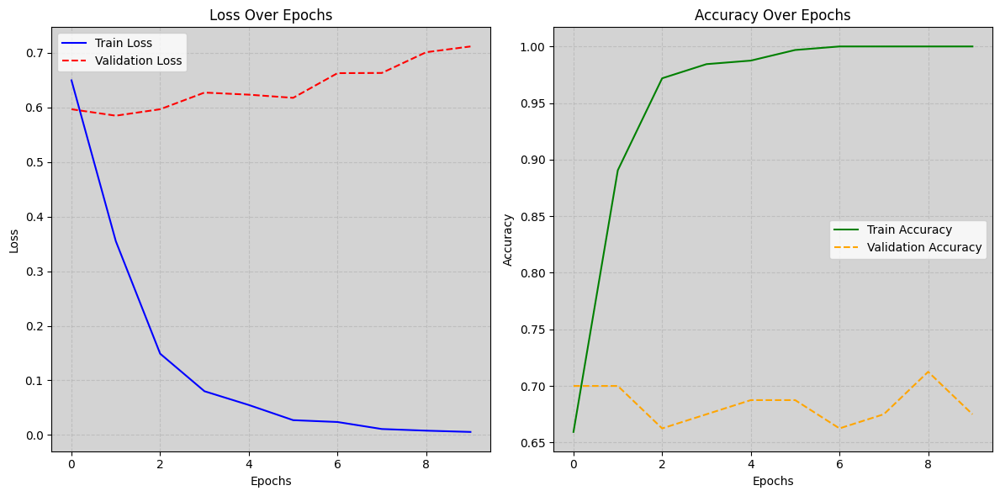

Finished Training


In [ ]:
Train(model, train_loader, val_loader)

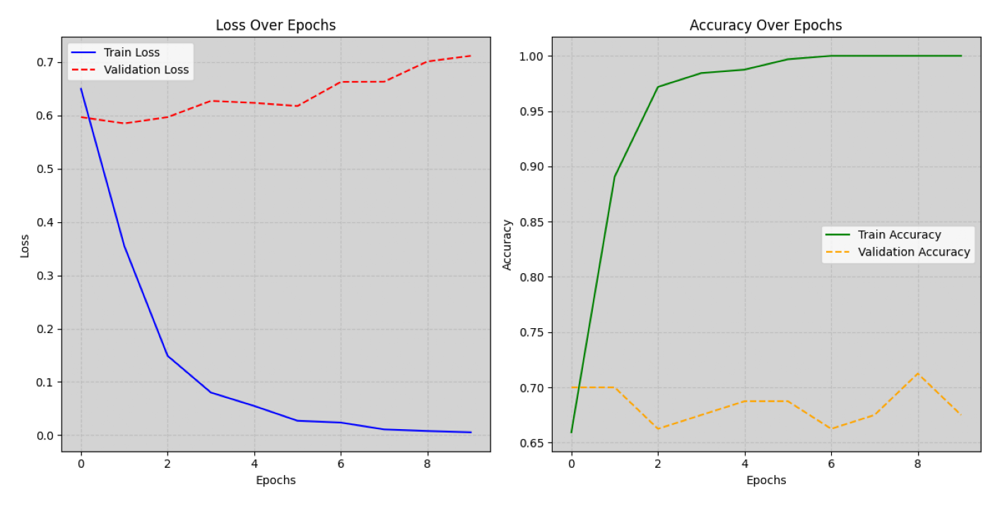

In [ ]:

image_path = '/content/drive/MyDrive/Colab Notebooks/Data Project/Final/SlowFast/PLOT/metrix_2023-09-06 09:39:27.987652.png'
img = mpimg.imread(image_path)

plt.figure(figsize=(18, 10))

plt.imshow(img)
plt.axis('off')  # Turn off axis labels and ticks
plt.show()


In [ ]:
!tensorboard dev upload \
  --logdir '/content/drive/MyDrive/Colab Notebooks/Data Project/Final/SlowFast/logs/validation/2023-09-06 09:39:27.987652'\
  --name "SlowFast Loss & Accuracy" \
  --one_shot

2023-09-06 09:53:00.621531: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-09-06 09:53:01.454710: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2023-09-06 09:53:02.836135: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-09-06 09:53:03.158667: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA n

  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [1/50] Train Loss: 0.6652, Accuracy: 58.44%
Validation Loss: 0.5739, Accuracy: 76.25%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [2/50] Train Loss: 0.3373, Accuracy: 94.38%
Validation Loss: 0.4701, Accuracy: 78.75%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [3/50] Train Loss: 0.1034, Accuracy: 99.38%
Validation Loss: 0.4780, Accuracy: 76.25%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [4/50] Train Loss: 0.0741, Accuracy: 99.06%
Validation Loss: 0.4437, Accuracy: 82.50%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [5/50] Train Loss: 0.0605, Accuracy: 98.12%
Validation Loss: 0.6470, Accuracy: 72.50%
Checkpoint saved at /content/drive/MyDrive/Colab Notebooks/Data Project/Final/SlowFast/checkpoints_2023-09-06 10:53:18.365770/checkpoint_epoch5.pt


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [6/50] Train Loss: 0.0510, Accuracy: 98.75%
Validation Loss: 0.4977, Accuracy: 78.75%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [7/50] Train Loss: 0.0195, Accuracy: 100.00%
Validation Loss: 0.5322, Accuracy: 78.75%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [8/50] Train Loss: 0.0118, Accuracy: 99.69%
Validation Loss: 0.4725, Accuracy: 78.75%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [9/50] Train Loss: 0.0134, Accuracy: 99.69%
Validation Loss: 0.5497, Accuracy: 76.25%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [10/50] Train Loss: 0.0072, Accuracy: 100.00%
Validation Loss: 0.5449, Accuracy: 80.00%
Checkpoint saved at /content/drive/MyDrive/Colab Notebooks/Data Project/Final/SlowFast/checkpoints_2023-09-06 10:53:18.365770/checkpoint_epoch10.pt


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [11/50] Train Loss: 0.0044, Accuracy: 100.00%
Validation Loss: 0.5679, Accuracy: 80.00%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [12/50] Train Loss: 0.0133, Accuracy: 99.69%
Validation Loss: 0.5862, Accuracy: 78.75%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [13/50] Train Loss: 0.0166, Accuracy: 99.38%
Validation Loss: 0.5478, Accuracy: 78.75%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [14/50] Train Loss: 0.0230, Accuracy: 99.38%
Validation Loss: 0.6404, Accuracy: 77.50%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [15/50] Train Loss: 0.0267, Accuracy: 99.38%
Validation Loss: 0.5513, Accuracy: 80.00%
Checkpoint saved at /content/drive/MyDrive/Colab Notebooks/Data Project/Final/SlowFast/checkpoints_2023-09-06 10:53:18.365770/checkpoint_epoch15.pt


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [16/50] Train Loss: 0.0519, Accuracy: 98.44%
Validation Loss: 0.4547, Accuracy: 81.25%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [17/50] Train Loss: 0.0102, Accuracy: 100.00%
Validation Loss: 0.4705, Accuracy: 81.25%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [18/50] Train Loss: 0.0271, Accuracy: 99.69%
Validation Loss: 0.4961, Accuracy: 80.00%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [19/50] Train Loss: 0.0201, Accuracy: 99.38%
Validation Loss: 0.4991, Accuracy: 82.50%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [20/50] Train Loss: 0.0051, Accuracy: 100.00%
Validation Loss: 0.4967, Accuracy: 82.50%
Checkpoint saved at /content/drive/MyDrive/Colab Notebooks/Data Project/Final/SlowFast/checkpoints_2023-09-06 10:53:18.365770/checkpoint_epoch20.pt


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [21/50] Train Loss: 0.0141, Accuracy: 99.38%
Validation Loss: 0.5012, Accuracy: 83.75%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [22/50] Train Loss: 0.0060, Accuracy: 100.00%
Validation Loss: 0.5113, Accuracy: 78.75%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [23/50] Train Loss: 0.0155, Accuracy: 99.06%
Validation Loss: 0.6097, Accuracy: 78.75%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [24/50] Train Loss: 0.0392, Accuracy: 99.38%
Validation Loss: 0.5843, Accuracy: 81.25%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [25/50] Train Loss: 0.0062, Accuracy: 100.00%
Validation Loss: 0.6713, Accuracy: 73.75%
Checkpoint saved at /content/drive/MyDrive/Colab Notebooks/Data Project/Final/SlowFast/checkpoints_2023-09-06 10:53:18.365770/checkpoint_epoch25.pt


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [26/50] Train Loss: 0.0029, Accuracy: 100.00%
Validation Loss: 0.6182, Accuracy: 80.00%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [27/50] Train Loss: 0.0017, Accuracy: 100.00%
Validation Loss: 0.6910, Accuracy: 73.75%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [28/50] Train Loss: 0.0018, Accuracy: 100.00%
Validation Loss: 0.6512, Accuracy: 80.00%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [29/50] Train Loss: 0.0012, Accuracy: 100.00%
Validation Loss: 0.7014, Accuracy: 77.50%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [30/50] Train Loss: 0.0013, Accuracy: 100.00%
Validation Loss: 0.6930, Accuracy: 78.75%
Checkpoint saved at /content/drive/MyDrive/Colab Notebooks/Data Project/Final/SlowFast/checkpoints_2023-09-06 10:53:18.365770/checkpoint_epoch30.pt


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [31/50] Train Loss: 0.0008, Accuracy: 100.00%
Validation Loss: 0.6862, Accuracy: 78.75%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [32/50] Train Loss: 0.0008, Accuracy: 100.00%
Validation Loss: 0.7039, Accuracy: 77.50%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [33/50] Train Loss: 0.0035, Accuracy: 100.00%
Validation Loss: 0.7928, Accuracy: 78.75%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [34/50] Train Loss: 0.0013, Accuracy: 100.00%
Validation Loss: 0.7306, Accuracy: 78.75%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [35/50] Train Loss: 0.0013, Accuracy: 100.00%
Validation Loss: 0.7957, Accuracy: 77.50%
Checkpoint saved at /content/drive/MyDrive/Colab Notebooks/Data Project/Final/SlowFast/checkpoints_2023-09-06 10:53:18.365770/checkpoint_epoch35.pt


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [36/50] Train Loss: 0.0006, Accuracy: 100.00%
Validation Loss: 0.7679, Accuracy: 81.25%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [37/50] Train Loss: 0.0008, Accuracy: 100.00%
Validation Loss: 0.7000, Accuracy: 80.00%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [38/50] Train Loss: 0.0004, Accuracy: 100.00%
Validation Loss: 0.7724, Accuracy: 81.25%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [39/50] Train Loss: 0.0003, Accuracy: 100.00%
Validation Loss: 0.7430, Accuracy: 80.00%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [40/50] Train Loss: 0.0010, Accuracy: 100.00%
Validation Loss: 0.7498, Accuracy: 81.25%
Checkpoint saved at /content/drive/MyDrive/Colab Notebooks/Data Project/Final/SlowFast/checkpoints_2023-09-06 10:53:18.365770/checkpoint_epoch40.pt


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [41/50] Train Loss: 0.0007, Accuracy: 100.00%
Validation Loss: 0.7780, Accuracy: 78.75%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [42/50] Train Loss: 0.0003, Accuracy: 100.00%
Validation Loss: 0.8397, Accuracy: 77.50%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [43/50] Train Loss: 0.0003, Accuracy: 100.00%
Validation Loss: 0.7997, Accuracy: 78.75%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [44/50] Train Loss: 0.0003, Accuracy: 100.00%
Validation Loss: 0.7455, Accuracy: 81.25%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [45/50] Train Loss: 0.0003, Accuracy: 100.00%
Validation Loss: 0.7519, Accuracy: 81.25%
Checkpoint saved at /content/drive/MyDrive/Colab Notebooks/Data Project/Final/SlowFast/checkpoints_2023-09-06 10:53:18.365770/checkpoint_epoch45.pt


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [46/50] Train Loss: 0.0003, Accuracy: 100.00%
Validation Loss: 0.7628, Accuracy: 80.00%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [47/50] Train Loss: 0.0002, Accuracy: 100.00%
Validation Loss: 0.7895, Accuracy: 80.00%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [48/50] Train Loss: 0.0002, Accuracy: 100.00%
Validation Loss: 0.8673, Accuracy: 80.00%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [49/50] Train Loss: 0.0003, Accuracy: 100.00%
Validation Loss: 0.8150, Accuracy: 78.75%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [50/50] Train Loss: 0.0003, Accuracy: 100.00%
Validation Loss: 0.8200, Accuracy: 78.75%
Checkpoint saved at /content/drive/MyDrive/Colab Notebooks/Data Project/Final/SlowFast/checkpoints_2023-09-06 10:53:18.365770/checkpoint_epoch50.pt
Best checkpoint saved at /content/drive/MyDrive/Colab Notebooks/Data Project/Final/SlowFast/checkpoints_2023-09-06 10:53:18.365770/best.pt


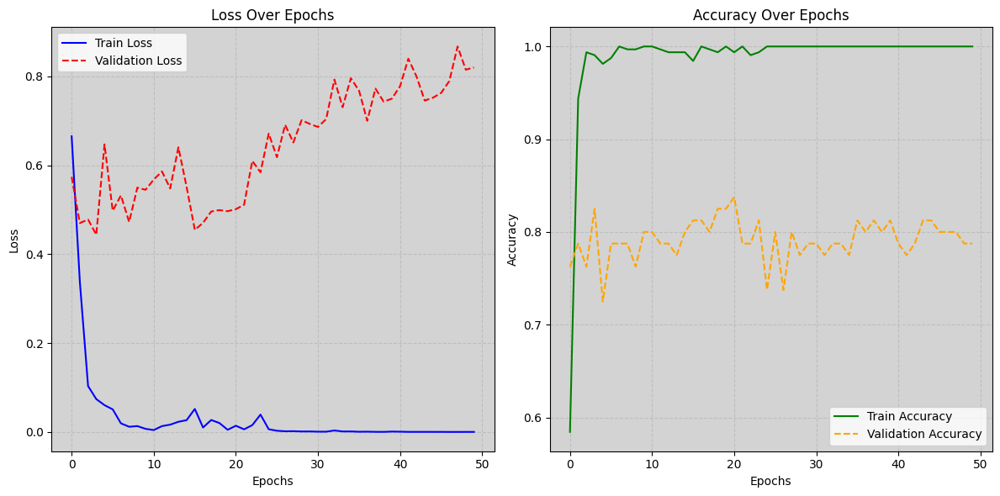

Finished Training


In [ ]:
CFG['EPOCHS'] = 50
Train(model, train_loader, val_loader)

### 데이터 증강 후

#### EPOCHS 10

  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [1/10] Train Loss: 0.6828, Accuracy: 56.88%
Validation Loss: 0.9619, Accuracy: 37.50%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [2/10] Train Loss: 0.6683, Accuracy: 59.69%
Validation Loss: 2.2682, Accuracy: 53.75%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [3/10] Train Loss: 0.6423, Accuracy: 60.31%
Validation Loss: 1.1933, Accuracy: 36.25%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [4/10] Train Loss: 0.6155, Accuracy: 66.25%
Validation Loss: 1.3849, Accuracy: 46.25%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [5/10] Train Loss: 0.5828, Accuracy: 70.62%
Validation Loss: 1.0522, Accuracy: 51.25%
Checkpoint saved at /content/drive/MyDrive/Colab Notebooks/Data Project/Final/SlowFast/checkpoints_2023-09-06 09:29:39.270477/checkpoint_epoch5.pt


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [6/10] Train Loss: 0.5816, Accuracy: 67.81%
Validation Loss: 1.0028, Accuracy: 46.25%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [7/10] Train Loss: 0.5785, Accuracy: 70.94%
Validation Loss: 1.9667, Accuracy: 40.00%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [8/10] Train Loss: 0.5187, Accuracy: 71.25%
Validation Loss: 1.4667, Accuracy: 42.50%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [9/10] Train Loss: 0.5319, Accuracy: 71.56%
Validation Loss: 2.0409, Accuracy: 37.50%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [10/10] Train Loss: 0.5402, Accuracy: 72.81%
Validation Loss: 0.8577, Accuracy: 60.00%
Checkpoint saved at /content/drive/MyDrive/Colab Notebooks/Data Project/Final/SlowFast/checkpoints_2023-09-06 09:29:39.270477/checkpoint_epoch10.pt
Best checkpoint saved at /content/drive/MyDrive/Colab Notebooks/Data Project/Final/SlowFast/checkpoints_2023-09-06 09:29:39.270477/best.pt


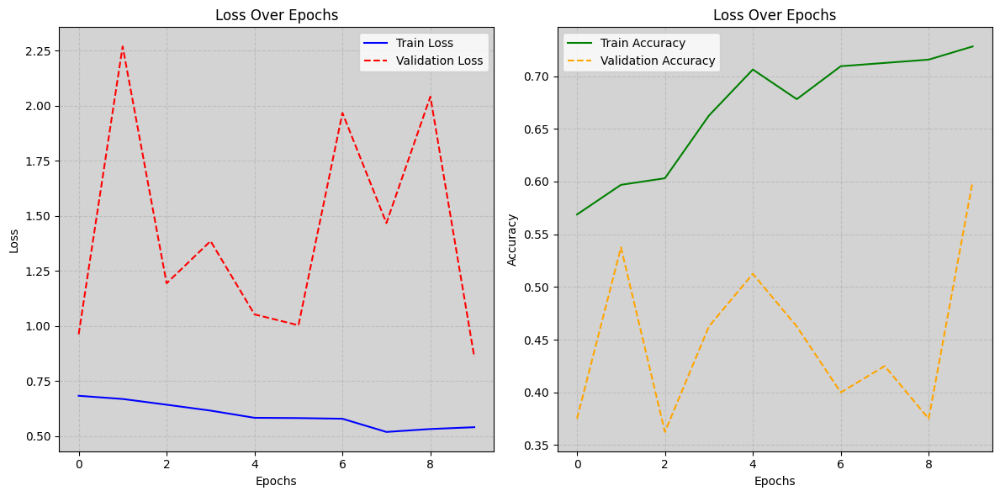

Finished Training


In [ ]:
Train(model, train_loader, val_loader)

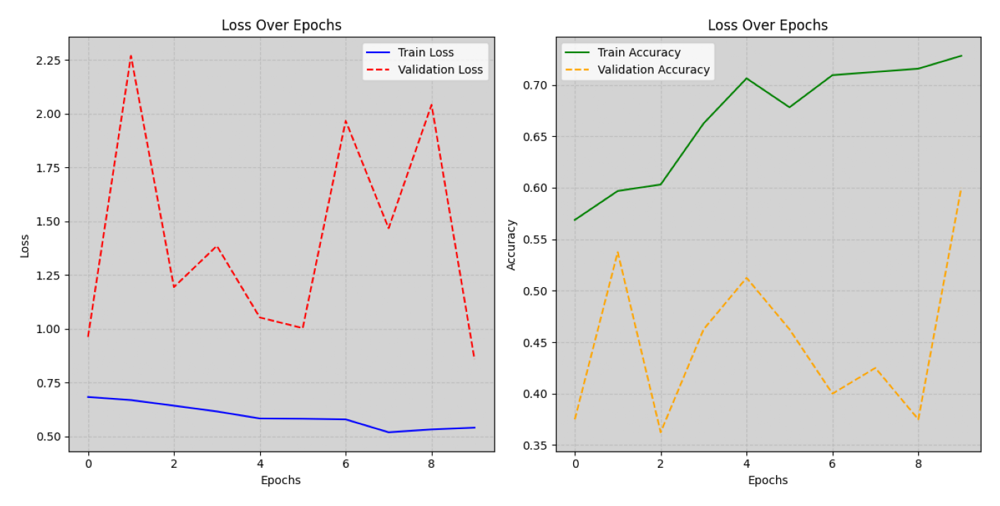

In [ ]:
image_path = '/content/drive/MyDrive/Colab Notebooks/Data Project/Final/SlowFast/PLOT/metrix_2023-09-06 09:29:39.270477.png'
img = mpimg.imread(image_path)

plt.figure(figsize=(18, 10))

plt.imshow(img)
plt.axis('off')  # Turn off axis labels and ticks
plt.show()

#### EPOCHS 50

  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [1/50] Train Loss: 0.5169, Accuracy: 73.75%
Validation Loss: 0.7449, Accuracy: 57.50%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [2/50] Train Loss: 0.5012, Accuracy: 77.81%
Validation Loss: 0.8062, Accuracy: 56.25%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [3/50] Train Loss: 0.4846, Accuracy: 75.00%
Validation Loss: 0.7648, Accuracy: 55.00%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [4/50] Train Loss: 0.4701, Accuracy: 76.25%
Validation Loss: 0.7294, Accuracy: 58.75%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [5/50] Train Loss: 0.4541, Accuracy: 75.94%
Validation Loss: 0.7696, Accuracy: 56.25%
Checkpoint saved at ./checkpoints_2023-09-06 00:12:20.041987/checkpoint_epoch5.pt


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [6/50] Train Loss: 0.4429, Accuracy: 77.19%
Validation Loss: 0.6861, Accuracy: 56.25%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [7/50] Train Loss: 0.4304, Accuracy: 80.62%
Validation Loss: 0.7992, Accuracy: 66.25%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [8/50] Train Loss: 0.4965, Accuracy: 72.81%
Validation Loss: 0.7557, Accuracy: 66.25%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [9/50] Train Loss: 0.3854, Accuracy: 81.88%
Validation Loss: 0.8642, Accuracy: 60.00%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [10/50] Train Loss: 0.4246, Accuracy: 78.12%
Validation Loss: 0.7462, Accuracy: 58.75%
Checkpoint saved at ./checkpoints_2023-09-06 00:12:20.041987/checkpoint_epoch10.pt


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [11/50] Train Loss: 0.4335, Accuracy: 77.50%
Validation Loss: 1.0597, Accuracy: 57.50%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [12/50] Train Loss: 0.3851, Accuracy: 80.94%
Validation Loss: 1.0563, Accuracy: 53.75%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [13/50] Train Loss: 0.4301, Accuracy: 77.81%
Validation Loss: 1.0519, Accuracy: 57.50%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [14/50] Train Loss: 0.3972, Accuracy: 80.62%
Validation Loss: 1.0020, Accuracy: 61.25%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [15/50] Train Loss: 0.4036, Accuracy: 78.44%
Validation Loss: 1.4426, Accuracy: 57.50%
Checkpoint saved at ./checkpoints_2023-09-06 00:12:20.041987/checkpoint_epoch15.pt


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [16/50] Train Loss: 0.3853, Accuracy: 81.88%
Validation Loss: 1.1489, Accuracy: 56.25%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [17/50] Train Loss: 0.4194, Accuracy: 80.62%
Validation Loss: 1.2069, Accuracy: 57.50%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [18/50] Train Loss: 0.3742, Accuracy: 81.25%
Validation Loss: 1.0284, Accuracy: 58.75%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [19/50] Train Loss: 0.3514, Accuracy: 84.06%
Validation Loss: 0.9548, Accuracy: 57.50%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [20/50] Train Loss: 0.3590, Accuracy: 82.19%
Validation Loss: 1.0458, Accuracy: 56.25%
Checkpoint saved at ./checkpoints_2023-09-06 00:12:20.041987/checkpoint_epoch20.pt


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [21/50] Train Loss: 0.3455, Accuracy: 82.81%
Validation Loss: 1.0786, Accuracy: 61.25%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [22/50] Train Loss: 0.3315, Accuracy: 85.31%
Validation Loss: 0.8260, Accuracy: 62.50%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [23/50] Train Loss: 0.3890, Accuracy: 82.50%
Validation Loss: 1.0757, Accuracy: 60.00%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [24/50] Train Loss: 0.3612, Accuracy: 82.50%
Validation Loss: 0.9953, Accuracy: 55.00%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [25/50] Train Loss: 0.3385, Accuracy: 84.06%
Validation Loss: 0.7789, Accuracy: 63.75%
Checkpoint saved at ./checkpoints_2023-09-06 00:12:20.041987/checkpoint_epoch25.pt


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [26/50] Train Loss: 0.3307, Accuracy: 84.38%
Validation Loss: 1.0552, Accuracy: 60.00%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [27/50] Train Loss: 0.3884, Accuracy: 82.81%
Validation Loss: 0.8140, Accuracy: 62.50%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [28/50] Train Loss: 0.3360, Accuracy: 84.38%
Validation Loss: 0.6669, Accuracy: 63.75%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [29/50] Train Loss: 0.3001, Accuracy: 86.88%
Validation Loss: 1.0439, Accuracy: 62.50%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [30/50] Train Loss: 0.2790, Accuracy: 87.50%
Validation Loss: 0.8400, Accuracy: 60.00%
Checkpoint saved at ./checkpoints_2023-09-06 00:12:20.041987/checkpoint_epoch30.pt


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [31/50] Train Loss: 0.2826, Accuracy: 86.25%
Validation Loss: 1.0985, Accuracy: 61.25%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [32/50] Train Loss: 0.3169, Accuracy: 83.44%
Validation Loss: 1.2881, Accuracy: 57.50%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [33/50] Train Loss: 0.3251, Accuracy: 84.69%
Validation Loss: 1.0292, Accuracy: 56.25%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [34/50] Train Loss: 0.3019, Accuracy: 85.31%
Validation Loss: 1.4236, Accuracy: 57.50%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [35/50] Train Loss: 0.3292, Accuracy: 85.00%
Validation Loss: 1.0221, Accuracy: 58.75%
Checkpoint saved at ./checkpoints_2023-09-06 00:12:20.041987/checkpoint_epoch35.pt


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [36/50] Train Loss: 0.2840, Accuracy: 86.56%
Validation Loss: 1.0122, Accuracy: 58.75%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [37/50] Train Loss: 0.2945, Accuracy: 86.25%
Validation Loss: 1.3681, Accuracy: 56.25%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [38/50] Train Loss: 0.3083, Accuracy: 85.62%
Validation Loss: 0.9643, Accuracy: 65.00%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [39/50] Train Loss: 0.2526, Accuracy: 87.81%
Validation Loss: 1.1105, Accuracy: 60.00%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [40/50] Train Loss: 0.2756, Accuracy: 86.25%
Validation Loss: 1.4305, Accuracy: 55.00%
Checkpoint saved at ./checkpoints_2023-09-06 00:12:20.041987/checkpoint_epoch40.pt


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [41/50] Train Loss: 0.2887, Accuracy: 86.25%
Validation Loss: 1.2598, Accuracy: 56.25%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [42/50] Train Loss: 0.2661, Accuracy: 87.19%
Validation Loss: 1.3778, Accuracy: 57.50%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [43/50] Train Loss: 0.2750, Accuracy: 87.81%
Validation Loss: 1.0852, Accuracy: 63.75%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [44/50] Train Loss: 0.2764, Accuracy: 86.56%
Validation Loss: 1.2366, Accuracy: 61.25%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [45/50] Train Loss: 0.2725, Accuracy: 87.19%
Validation Loss: 1.3312, Accuracy: 60.00%
Checkpoint saved at ./checkpoints_2023-09-06 00:12:20.041987/checkpoint_epoch45.pt


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [46/50] Train Loss: 0.2958, Accuracy: 87.19%
Validation Loss: 1.3630, Accuracy: 57.50%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [47/50] Train Loss: 0.2539, Accuracy: 87.81%
Validation Loss: 1.6923, Accuracy: 56.25%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [48/50] Train Loss: 0.2487, Accuracy: 87.19%
Validation Loss: 1.5419, Accuracy: 53.75%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [49/50] Train Loss: 0.2870, Accuracy: 85.00%
Validation Loss: 1.5717, Accuracy: 60.00%


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch [50/50] Train Loss: 0.2545, Accuracy: 86.88%
Validation Loss: 1.4566, Accuracy: 56.25%
Checkpoint saved at ./checkpoints_2023-09-06 00:12:20.041987/checkpoint_epoch50.pt
Best checkpoint saved at ./checkpoints_2023-09-06 00:12:20.041987/best.pt


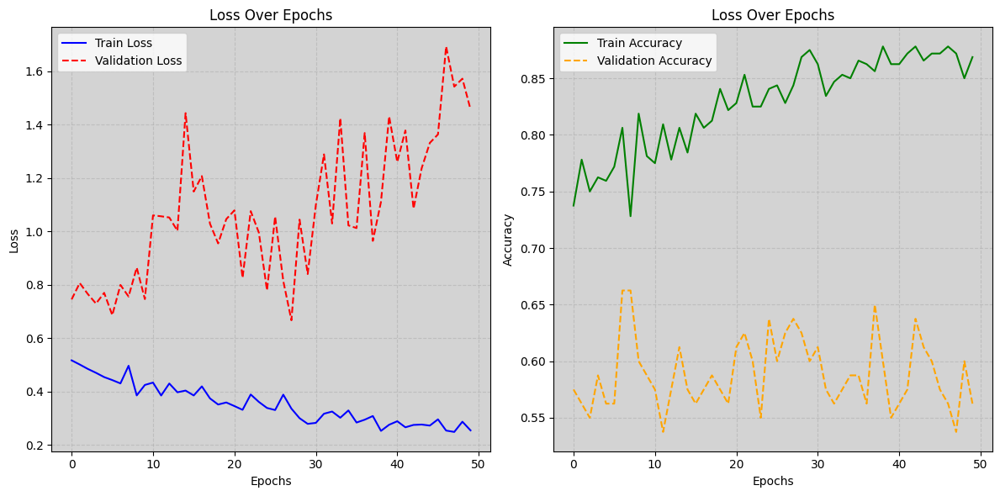

Finished Training


In [ ]:
Train(model, train_loader, val_loader)

In [ ]:
!tensorboard dev upload \
  --logdir "/content/logs/train/2023-09-06 00:12:20.041987" \
  --name "SlowFast Loss & Accuracy" \
  --one_shot

2023-09-06 00:53:41.748687: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-09-06 00:53:42.534033: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2023-09-06 00:53:43.845578: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-09-06 00:53:43.875149: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA n

In [ ]:
!tensorboard dev upload \
  --logdir "/content/logs/validation/2023-09-06 00:12:20.041987" \
  --name "SlowFast Loss & Accuracy" \
  --one_shot

2023-09-06 00:54:07.663687: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-09-06 00:54:08.463315: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2023-09-06 00:54:09.780096: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-09-06 00:54:09.808995: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA n

### Test

### 유튜브에서 테스트 비디오 가져오기   
- pytube 이용해서 테스트 비디오 다운

In [ ]:
!pip install pytube

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.6/57.6 kB 1.9 MB/s eta 0:00:00


In [ ]:
from pytube import YouTube

def down_youtube(down_path, url):
  yt = YouTube(url)
  yt.streams.filter(progressive=True, file_extension="mp4")\
    .order_by("resolution")\
    .desc()\
    .first()\
    .download(path)


In [ ]:
url_list = ['https://youtu.be/v5aU-eSFzK4?feature=shared',
            'https://youtu.be/heKKDKHZkgM?feature=shared',
            'https://youtu.be/7l8TC79f83c?feature=shared',
            'https://youtu.be/aIo4NORQp4Y?feature=shared',
            'https://youtu.be/XrC5qgp43Q8?feature=shared',
            'https://youtu.be/whgfdxcr6Ik?feature=shared',
            'https://www.youtube.com/watch?v=8pLINQ6kGkk'
            ]



path = 'TEST_VIDEO'
for url in url_list:
  down_youtube(path, url)


In [ ]:
base_path = '/content/TEST_VIDEO'
test_path = []
test_video = []

for dir in os.listdir('/content/TEST_VIDEO'):
  if '.ipynb_checkpoints' != dir:
    test_video.append(dir)
    test_path.append(os.path.join(base_path, dir))

test_path

['/content/TEST_VIDEO/1080p인천남동구보디빌더주차폭행사건(2023520) 원본영상블랙박스시네마.mp4',
 '/content/TEST_VIDEO/Video shows fight between off-duty cop men in NYC.mp4',
 '/content/TEST_VIDEO/Hamhung North-Korea street life (북한 함흥 거리 영상).mp4',
 '/content/TEST_VIDEO/남성부 주짓수 비기너 임정준 체급 1경기.mp4',
 '/content/TEST_VIDEO/【2020 Tokyo】 TOKYO LOCAL STREET WALK 길거리 산책.mp4',
 '/content/TEST_VIDEO/Mini Goldendoodle Puppy Gives Her Pet Dad Kisses on a Ring Cam｜RingTV.mp4']

In [ ]:
# def LoadCheckpoint(model, optimizer, checkpoint_path):
#     checkpoint = torch.load(checkpoint_path)
#     model.load_state_dict(checkpoint['model_state_dict'])
#     optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
#     epoch = checkpoint['epoch']
#     loss = checkpoint['loss']
#     accuracy = checkpoint['accuracy']

#     return model, optimizer, epoch, loss, accuracy


In [ ]:
def LoadCheckpoint(checkpoint_path):
  checkpoint = torch.load(checkpoint_path)
  epoch = checkpoint['epoch']
  loss = checkpoint['loss']
  accuracy = checkpoint['accuracy']

  print(f'Epochs : {epoch}, Loss : {loss}, Accuracy : {accuracy}')



In [ ]:
LoadCheckpoint('/content/drive/MyDrive/Colab Notebooks/Data Project/Final/SlowFast/checkpoints_2023-09-06 09:39:27.987652/best.pt')


Epochs : 1, Loss : 0.35489979274570943, Accuracy : 0.890625


In [ ]:
LoadCheckpoint('/content/drive/MyDrive/Colab Notebooks/Data Project/Final/SlowFast/data_argument_checkpoints_2023-09-06 09:29:39.270477/best.pt')


Epochs : 9, Loss : 0.5401637084782124, Accuracy : 0.728125


### 테스트 비디오 예측 및 이상행동 예측 동영상 추출

In [17]:
import cv2
import numpy as np
from moviepy.editor import *

def TestAndGenerateVideo(input_video_path, model, test_loader, class_mapping, device, output_video_file):
    model.to(device)
    model.eval()  # 모델을 평가 모드로 설정

    # .mp4 파일로 저장할 비디오 설정
    current_datetime = datetime.now()
    predicted_video_dir = f'{drive_path}/Predicted_VIDEO/{current_datetime}'
    os.makedirs(predicted_video_dir, exist_ok=True)
    save_path = os.path.join(predicted_video_dir,output_video_file)

    cap = cv2.VideoCapture(input_video_path)
    frame_width = int(cap.get(3))
    frame_height = int(cap.get(4))
    out = cv2.VideoWriter(save_path, cv2.VideoWriter_fourcc(*'mp4v'), 30, (frame_width, frame_height))

    video_predictions = []  # 비디오별 예측 결과를 저장할 리스트 추가

    with torch.no_grad():
        for fast_videos, videos in tqdm(iter(test_loader)):
            video_batch_predictions = []  # 배치별로 비디오 예측 결과를 저장할 리스트

            for fast_video, video in zip(fast_videos, videos):
                # fast_video 및 video를 GPU로 이동
                fast_video = fast_video.to(device)
                video = video.to(device)

                # 모델 순전파
                outputs = model([fast_video, video])

                # 소프트맥스 함수를 사용하여 예측 확률 계산
                probs = torch.softmax(outputs, dim=1)

                # 가장 높은 확률을 갖는 클래스 인덱스를 추출
                _, predicted = torch.max(probs, 1)

                # 비디오별 예측 결과 저장
                video_batch_predictions.append(predicted.cpu().numpy())


            # 예측 결과와 확률 출력
            for i, label in enumerate(video_batch_predictions):
              frame_counte = 0
              class_name = class_mapping[label.item()]
              while frame_counte < 50:
                frame_counte += 1
                ret, frame = cap.read()
                if not ret:
                    break

                # 폰트 설정
                if class_name ==  'Normal':
                  font_color = (255, 255, 255) # white
                else:
                  font_color = (0, 0, 255) # red

                # font_scale = min(frame_width, frame_height) / 1000.0

                # 폰트 크기 조정
                font = cv2.FONT_HERSHEY_COMPLEX
                font_scale = 2
                thickness = 2
                text = f'frame : {i*50 + frame_counte} - predicted : {class_name}'
                text_size = cv2.getTextSize(text, font, font_scale, thickness)[0]
                text_x = int((frame_width - text_size[0]) / 2)
                text_y = int(frame_height - 10)  # 화면 하단에 위치
                frame_with_label = cv2.putText(frame, text, (text_x, text_y), font, font_scale, font_color, thickness, cv2.LINE_AA)
                out.write(frame_with_label)


    # # 원본 테스트 비디오 프레임에 대한 예측 결과 표시
    # for i, video_preds in enumerate(video_predictions):
    #     class_names = [class_mapping[pred] for pred in video_preds]
    #     print(f"Video {i} Frame-by-Frame Class Predictions: {class_names}")

    # 비디오 파일 닫기
    cap.release()
    out.release()
    cv2.destroyAllWindows()

    all_predictions = np.concatenate(video_batch_predictions)

    # 0과 1의 빈도
    count_0 = np.sum(all_predictions == 0) # Anormaly
    count_1 = np.sum(all_predictions == 1) # Normal

    # 0과 1의 빈도를 이용하여 확률을 계산
    total_count = len(all_predictions)
    probability_0 = count_0 / total_count
    probability_1 = count_1 / total_count


    print('------------------------ Predicted Results ------------------------')
    print(f'Anomaly Frames (Class 0): {count_0 * CFG["VIDEO_LENGTH"]} frames ({probability_0 * 100:.2f}%)')
    print(f'Normal Frames (Class 1): {count_1 * CFG["VIDEO_LENGTH"]} frames ({probability_1 * 100:.2f}%)')
    print()

    if probability_0 > probability_1:
        print(f'The video is predicted to be Anomaly with confidence {probability_0 * 100:.2f}%')
    else:
        print(f'The video is predicted to be Normal with confidence {probability_1 * 100:.2f}%')

    print()
    print(f"프레임별 예측 결과가 포함된 {save_path} 파일이 생성되었습니다.")



In [ ]:
best_path = '/content/drive/MyDrive/Colab Notebooks/Data Project/Final/SlowFast/checkpoints_2023-09-06 09:39:27.987652/best.pt'

checkpoint = torch.load(best_path)
model = SlowFast(img_size=CFG['IMG_SIZE'])
model.load_state_dict(checkpoint['model_state_dict'])

<All keys matched successfully>

In [ ]:
test_path = '/content/TEST_VIDEO/Mini Goldendoodle Puppy Gives Her Pet Dad Kisses on a Ring Cam｜RingTV.mp4'
test_dataset = CustomDataset([test_path], None, None, False)
test_loader = DataLoader(test_dataset, batch_size = CFG['BATCH_SIZE'], shuffle=False, num_workers=2)

In [ ]:
output_video_path = 'Mini Goldendoodle Puppy.mp4'
TestAndGenerateVideo('/content/TEST_VIDEO/Mini Goldendoodle Puppy Gives Her Pet Dad Kisses on a Ring Cam｜RingTV.mp4', model, test_loader, unique_label_mapping, device, output_video_path)

  0%|          | 0/1 [00:00<?, ?it/s]

------------------------ Predicted Results ------------------------
Anomaly Frames (Class 0): 550 frames (84.62%)
Normal Frames (Class 1): 100 frames (15.38%)

The video is predicted to be Anomaly with confidence 84.62%

프레임별 예측 결과가 포함된 /content/drive/MyDrive/Colab Notebooks/Data Project/Final/SlowFast/Predicted_VIDEO/2023-09-06 10:15:35.486014/Mini Goldendoodle Puppy.mp4 파일이 생성되었습니다.


In [ ]:
test_path = '/content/TEST_VIDEO/【2020 Tokyo】 TOKYO LOCAL STREET WALK 길거리 산책.mp4'
test_dataset = CustomDataset([test_path], None, None, False)
test_loader = DataLoader(test_dataset, batch_size = CFG['BATCH_SIZE'], shuffle=False, num_workers=2)

In [ ]:
output_video_path = 'TOKYO.mp4'
TestAndGenerateVideo(test_path, model, test_loader, unique_label_mapping, device, output_video_path)

  0%|          | 0/1 [00:00<?, ?it/s]

------------------------ Predicted Results ------------------------
Anomaly Frames (Class 0): 3450 frames (28.87%)
Normal Frames (Class 1): 8500 frames (71.13%)

The video is predicted to be Normal with confidence 71.13%

프레임별 예측 결과가 포함된 /content/drive/MyDrive/Colab Notebooks/Data Project/Final/SlowFast/Predicted_VIDEO/2023-09-06 10:16:08.493245/TOKYO.mp4 파일이 생성되었습니다.


In [19]:
def predict_video(best_path, test_path, output_video_name):
  checkpoint = torch.load(best_path)
  model = SlowFast(img_size=CFG['IMG_SIZE'])
  model.load_state_dict(checkpoint['model_state_dict'])
  test_dataset = CustomDataset([test_path], None, None, False)
  test_loader = DataLoader(test_dataset, batch_size = CFG['BATCH_SIZE'], shuffle=False, num_workers=2)
  TestAndGenerateVideo(test_path, model, test_loader, unique_label_mapping, device, output_video_name)


In [ ]:
best_path = '/content/drive/MyDrive/Colab Notebooks/Data Project/Final/SlowFast/checkpoints_2023-09-06 09:39:27.987652/best.pt'
test_path = '/content/TEST_VIDEO/남성부 주짓수 비기너 임정준 체급 1경기.mp4'

predict_video(best_path, test_path, '주짓수.mp4')

  0%|          | 0/1 [00:00<?, ?it/s]

------------------------ Predicted Results ------------------------
Anomaly Frames (Class 0): 500 frames (7.14%)
Normal Frames (Class 1): 6500 frames (92.86%)

The video is predicted to be Normal with confidence 92.86%

프레임별 예측 결과가 포함된 /content/drive/MyDrive/Colab Notebooks/Data Project/Final/SlowFast/Predicted_VIDEO/2023-09-06 10:20:20.503968/주짓수.mp4 파일이 생성되었습니다.


In [ ]:
best_path = '/content/drive/MyDrive/Colab Notebooks/Data Project/Final/SlowFast/checkpoints_2023-09-06 09:39:27.987652/best.pt'
test_path = '/content/TEST_VIDEO/[자막뉴스] 그 XX 어딨어 어딨냐고!!공포의 야구모자 13시간 풀스윙 (20230510MBC뉴스).mp4'

predict_video(best_path, test_path, '공포의 야구모자 13시간 풀스윙.mp4')

  0%|          | 0/1 [00:00<?, ?it/s]

------------------------ Predicted Results ------------------------
Anomaly Frames (Class 0): 3550 frames (95.95%)
Normal Frames (Class 1): 150 frames (4.05%)

The video is predicted to be Anomaly with confidence 95.95%

프레임별 예측 결과가 포함된 /content/drive/MyDrive/Colab Notebooks/Data Project/Final/SlowFast/Predicted_VIDEO/2023-09-06 10:30:44.699804/공포의 야구모자 13시간 풀스윙.mp4 파일이 생성되었습니다.


In [ ]:
best_path = '/content/drive/MyDrive/Colab Notebooks/Data Project/Final/SlowFast/checkpoints_2023-09-06 09:39:27.987652/best.pt'
test_path = '/content/TEST_VIDEO/희귀영상) 연예인 싸움 1위 cctv 에 찍힌 싸우는 영상.mp4'

predict_video(best_path, test_path, 'cctv_싸움.mp4')

  0%|          | 0/1 [00:00<?, ?it/s]

------------------------ Predicted Results ------------------------
Anomaly Frames (Class 0): 1200 frames (70.59%)
Normal Frames (Class 1): 500 frames (29.41%)

The video is predicted to be Anomaly with confidence 70.59%

프레임별 예측 결과가 포함된 /content/drive/MyDrive/Colab Notebooks/Data Project/Final/SlowFast/Predicted_VIDEO/2023-09-06 10:41:36.414638/cctv_싸움.mp4 파일이 생성되었습니다.


### EPOCHS 10

In [ ]:
best_path = '/content/drive/MyDrive/Colab Notebooks/Data Project/Final/SlowFast/checkpoints_2023-09-06 09:39:27.987652/best.pt'
test_path = '/content/TEST_VIDEO/희귀영상) 연예인 싸움 1위 cctv 에 찍힌 싸우는 영상.mp4'

predict_video(best_path, test_path, 'cctv_싸움.mp4')


  0%|          | 0/1 [00:00<?, ?it/s]

------------------------ Predicted Results ------------------------
Anomaly Frames (Class 0): 1200 frames (70.59%)
Normal Frames (Class 1): 500 frames (29.41%)

The video is predicted to be Anomaly with confidence 70.59%

프레임별 예측 결과가 포함된 /content/drive/MyDrive/Colab Notebooks/Data Project/Final/SlowFast/Predicted_VIDEO/2023-09-06 11:27:22.386400/cctv_싸움.mp4 파일이 생성되었습니다.


#### Epochs 50

In [ ]:
best_path = '/content/drive/MyDrive/Colab Notebooks/Data Project/Final/SlowFast/checkpoints_2023-09-06 10:53:18.365770/best.pt'
test_path = '/content/TEST_VIDEO/희귀영상) 연예인 싸움 1위 cctv 에 찍힌 싸우는 영상.mp4'

predict_video(best_path, test_path, 'cctv_싸움.mp4')

  0%|          | 0/1 [00:00<?, ?it/s]

------------------------ Predicted Results ------------------------
Anomaly Frames (Class 0): 900 frames (52.94%)
Normal Frames (Class 1): 800 frames (47.06%)

The video is predicted to be Anomaly with confidence 52.94%

프레임별 예측 결과가 포함된 /content/drive/MyDrive/Colab Notebooks/Data Project/Final/SlowFast/Predicted_VIDEO/2023-09-06 11:29:05.101854/cctv_싸움.mp4 파일이 생성되었습니다.


### Test 예측 영상 확인

In [28]:
from IPython.display import HTML
from base64 import b64encode
from moviepy.editor import VideoFileClip
import os
from moviepy.video.io.ffmpeg_tools import ffmpeg_extract_subclip

import os
from moviepy.video.io.ffmpeg_tools import ffmpeg_extract_subclip
from moviepy.editor import VideoFileClip
from IPython.display import HTML
from base64 import b64encode
from moviepy.editor import *

def reduce_bitrate(file_path, target_bitrate='500k'):
    output_directory = f'{drive_path}/REDUCED_VIDEO'
    os.makedirs(output_directory, exist_ok=True)
    output_video_path = os.path.join(output_directory, os.path.basename(file_path))

    # Run ffmpeg command to reduce bitrate
    os.system(f'ffmpeg -i "{file_path}" -b:v {target_bitrate} "{output_video_path}"')

    return output_video_path

    return output_video_path
def cut_video(start_time, end_time, file_path):
    cut_dir = f'{drive_path}/CUT_VIDEO'
    os.makedirs(cut_dir, exist_ok=True)
    targetname = os.path.join(cut_dir, file_path.split('.mp4')[0].split('/')[-1] + "_cut_video.mp4")
    ffmpeg_extract_subclip(file_path, start_time, end_time, targetname)
    return targetname

def play_video(file_path):
    try:
        with VideoFileClip(file_path) as video:
            file_path = reduce_bitrate(file_path, '500k')
            duration = video.duration
            if duration > 240:
                file_path = cut_video(20, 150, file_path)

            video_data = open(file_path, 'rb').read()
            data_url = "data:video/mp4;base64," + b64encode(video_data).decode()
            display(HTML("""
            <video width=500 height="300" controls>
                <source src="%s" type="video/mp4">
            </video>
            """ % data_url))
    except Exception as e:
        print(f"Error: {e}")





### EPOCHS 10

- Anomaly Frames (Class 0): 1200 frames (70.59%)
- Normal Frames (Class 1): 500 frames (29.41%)

The video is predicted to be Anomaly with confidence 70.59%

In [ ]:
play_video('/content/drive/MyDrive/Colab Notebooks/Data Project/Final/SlowFast/Predicted_VIDEO/2023-09-06 10:47:51.504764/cctv_싸움.mp4')

Output hidden; open in https://colab.research.google.com to view.

### EPOCHS 50

- Anomaly Frames (Class 0): 900 frames (52.94%)
- Normal Frames (Class 1): 800 frames (47.06%)

The video is predicted to be Anomaly with confidence 52.94%

In [ ]:
play_video('/content/drive/MyDrive/Colab Notebooks/Data Project/Final/SlowFast/Predicted_VIDEO/2023-09-06 11:29:05.101854/cctv_싸움.mp4')

Output hidden; open in https://colab.research.google.com to view.

### Epoch 10 데이터 증강 모델


- Anomaly Frames (Class 0): 1200 frames (70.59%)
- Normal Frames (Class 1): 500 frames (29.41%)

The video is predicted to be Anomaly with confidence 70.59%


In [ ]:
play_video('/content/drive/MyDrive/Colab Notebooks/Data Project/Final/SlowFast/Predicted_VIDEO/2023-09-06 10:41:36.414638/cctv_싸움.mp4')

Output hidden; open in https://colab.research.google.com to view.

- Anomaly Frames (Class 0): 550 frames (84.62%)
- Normal Frames (Class 1): 100 frames (15.38%)

The video is predicted to be Anomaly with confidence 84.62%

In [ ]:
play_video('/content/drive/MyDrive/Colab Notebooks/Data Project/Final/SlowFast/Predicted_VIDEO/2023-09-06 10:15:35.486014/Mini Goldendoodle Puppy.mp4')

- Anomaly Frames (Class 0): 3450 frames (28.87%)
- Normal Frames (Class 1): 8500 frames (71.13%)

The video is predicted to be Normal with confidence 71.13%


In [ ]:
play_video('/content/drive/MyDrive/Colab Notebooks/Data Project/Final/SlowFast/Predicted_VIDEO/2023-09-06 10:16:08.493245/TOKYO.mp4')


Output hidden; open in https://colab.research.google.com to view.

- Anomaly Frames (Class 0): 500 frames (7.14%)
- Normal Frames (Class 1): 6500 frames (92.86%)

The video is predicted to be Normal with confidence 92.86%

In [ ]:
play_video('/content/drive/MyDrive/Colab Notebooks/Data Project/Final/SlowFast/Predicted_VIDEO/2023-09-06 10:20:20.503968/주짓수.mp4')

Output hidden; open in https://colab.research.google.com to view.

- Anomaly Frames (Class 0): 3550 frames (95.95%)
- Normal Frames (Class 1): 150 frames (4.05%)

The video is predicted to be Anomaly with confidence 95.95%


In [ ]:
play_video('/content/drive/MyDrive/Colab Notebooks/Data Project/Final/SlowFast/Predicted_VIDEO/2023-09-06 10:30:44.699804/공포의 야구모자 13시간 풀스윙.mp4')

Output hidden; open in https://colab.research.google.com to view.

### Epochs 50 , 데이터 증강 모델

### Normal

#### 1. Mini Goldendoodle Puppy

The video is predicted to be Normal with confidence 53.85%

- Anomaly Frames (Class 0): 300 frames (46.15%)
- Normal Frames (Class 1): 350 frames (53.85%)



In [ ]:
play_video('./Predicted_VIDEO/2023-09-06 03:32:58.458840/Mini Goldendoodle Puppy.mp4')

- Anomaly Frames (Class 0): 10250 frames (85.77%)
- Normal Frames (Class 1): 1700 frames (14.23%)

The video is predicted to be Anomaly with confidence 85.77%

In [ ]:
play_video('./Predicted_VIDEO/2023-09-06 03:34:17.228182/TOKYO.mp4')

Moviepy - Running:
>>> "+ " ".join(cmd)
Moviepy - Command successful


-------------

In [27]:
best_path = '/content/drive/MyDrive/Colab Notebooks/Data Project/Final/SlowFast/data_argument_checkpoints_2023-09-06 09:29:39.270477/best.pt'
test_path = '/content/yolo_detection.mp4'

predict_video(best_path, test_path, 'YOLO.mp4')

  0%|          | 0/1 [00:00<?, ?it/s]

------------------------ Predicted Results ------------------------
Anomaly Frames (Class 0): 0 frames (0.00%)
Normal Frames (Class 1): 150 frames (100.00%)

The video is predicted to be Normal with confidence 100.00%

프레임별 예측 결과가 포함된 /content/drive/MyDrive/Colab Notebooks/Data Project/Final/SlowFast/Predicted_VIDEO/2023-09-07 10:13:07.706685/YOLO.mp4 파일이 생성되었습니다.


In [29]:
play_video('/content/drive/MyDrive/Colab Notebooks/Data Project/Final/SlowFast/Predicted_VIDEO/2023-09-07 10:13:07.706685/YOLO.mp4')